# Binary Search Trees

*And all this time I thought "BST" stood for some kind of sandwich* 🥪

Binary Search Trees
- Only two children, specific meaning
- Inorder traversal
- Searching for a value
- Big O for search

A **Binary Search Tree (BST)** is a tree with a few additional qualities:

- There are no duplicate values in the tree
- Each node has at most two children:
  - A `left` subtree whose maximum value is smaller than the current value
  - A `right` subtree whose minimum value is larger than the current value


In [1]:
%%file test.txt
5 > 3
3 > 2
3 < 4
2 > 1
5 < 7
7 > 6
7 < 9
9 > 8

Overwriting test.txt


In [2]:
!rm test.png && python /data/projects/btrees/btrees.py test.txt

<img src='test.png?foo1' />

- Each node has at most two children
  - The left child is always smaller than the node value
  - The right child is always greater than the node value
- There are no duplicates

- What is the maximum value of the left subtree of 5?
- What is the minimum value of the right subtree of 7?

## Traversing a BST

With a generic tree, the order you iterate through children is undefined.

For a BST, you always iterate from `left` to `right`.

What is the preorder (DFS) traversal of this tree?

<img src='test.png?foo1' />

5, 3, 2, 1, 4, 7, 6, 9, 8

What is the postorder (DFS) traversal of this tree?

<img src='test.png?foo1' />

1, 2, 4, 3, 6, 8, 9, 7, 5

With BSTs, there is another kind of traversal available: **in-order** (a.k.a *inorder*)

You process the left child before the node before the right child.

I.E. `left`, `this`, `right`

What is the inorder traversal of our binary tree?

<img src='test.png?foo1' />

1, 2, 3, 4, 5, 6, 7, 8, 9

<div class='big centered'> 🤯 </div>

<div class='big centered'> 😮 🤯 🤭 🤔 😵 😶‍🌫️ 😴 </div>

## Code

In [3]:
#include <string>
#include <iostream>
using namespace std;

In [4]:
template<class T>
struct Node {
    T value;
    Node<T>* left;
    Node<T>* right;
    explicit Node(T value) : value(value), left(nullptr), right(nullptr) {}
};

In [5]:
template<class T>
void print_inorder(Node<T>* const& node, string const& prefix = "") {
    if (node == nullptr) {
        return;
    }
    
    // Print left
    print_inorder(node->left, prefix + "  ");
    
    // Print node
    cout << prefix << node->value << endl;
    
    // Print right
    print_inorder(node->right, prefix + "  ");
}

In [6]:
Node<string>* M = new Node<string>("M");
M->left = new Node<string>("G");
M->right = new Node<string>("T");
M->left->left = new Node<string>("A");
M->left->right = new Node<string>("J");
M->right->left = new Node<string>("Q");

In [7]:
print_inorder(M)

    A
  G
    J
M
    Q
  T


## How can we tell if a value is in our BST?

Perform a depth-first-search!

- If the current node value is the search value, return true.
- If the search value is less than our current value, search the left subtree.
- If the search value is greater than our current value, search the right subtree.
- If I'm supposed to search the left or right subtree but there is no node there, return false.

- What is my base case?
- Do we progress towards the base case?
- Is the induction correct?

- What is my base case?
  - If the current node is the search value
  - If I'm supposed to recurse but there is no node to recurse onto
- Do we progress towards the base case?
  - Yes, at each step I move further down the tree.
  - At some point I'll find my value or run out of tree.
- Is the induction correct?
  - If the search value is equal to the current value I'm done.
  - Every value in the left subtree is less than the current value.
  - Every value in the right subtree is greater than the current value.
  - If the search value is greater than the current value, then if it is in the tree it will be found in the right subtree and we continue our search there.
    - Symmetric logic for the left side
  - So, if the problem isn't solved on step $k$, we progress towards a solution with step $k+1$.


In [8]:
template<class T>
Node<T>* search_bst(Node<T>* const& node, T item) {
    // If current node is null or the value is the same, return current
    if (node == nullptr || node->value == item) {
        return node;
    }
    
    // Check left
    if (item < node->value) {
        return search_bst(node->left, item);
    } else {
        // Check right
        return search_bst(node->right, item);
    }
}

In [11]:
auto node = search_bst(M, (string)"G");

if (node != nullptr) {
    cout << node->value << endl;
} else {
    cout << "nullptr" << endl;
}

G


In [12]:
print_inorder(node)

  A
G
  J


## BST Big O

What is the Big-O for BST search?

At each step we cut out half of the search values.

How many times can I cut $n$ values in half before I run out of values?

$O(\log n)$

We've observed the following properties about BSTs:

- $O(\log n)$ search time
- Does not permit duplicate values
- Prints out contents in sorted order (using the inorder traversal)

What data structure have we seen with these qualities?

A **set**!

Sets (i.e. *ordered* sets) are implemented with a BST.

But wait, you say.

You can add and remove items from a set. How do we do that to a BST?

## Adding Items to a BST

- Let the root be the current node.
- While the current node is not null:
  - If the item is equal to the current node value, return false (item not added)
  - If the item is greater than the current node value, let current = current.right
  - If the item is less than the current node value, let current == current.left
- Insert the item at the current location

In [11]:
%%file first.txt
5 > 3
3 < 4
5 < 7

Overwriting first.txt


In [12]:
!python /data/projects/btrees/btrees.py first.txt

<img src="first.png?1"/>

What do I get when I insert 2?

In [13]:
%%file first_p2.txt
5 > 3
3 < 4
5 < 7
3 > 2

Writing first_p2.txt


In [14]:
!python /data/projects/btrees/btrees.py first_p2.txt

- 2 < 5, go left
- 2 < 3, go left
- No node here, add it!

<img src="first_p2.png?1"/>

What happens when I insert 8?

In [15]:
%%file first_p2_p8.txt
5 > 3
3 < 4
5 < 7
3 > 2
7 < 8

Writing first_p2_p8.txt


In [16]:
!python /data/projects/btrees/btrees.py first_p2_p8.txt

- 8 > 5, go right
- 8 > 7, go right
- No node here, add it!

<img src="first_p2_p8.png?1"/>

What happens when I insert 4?

- 4 < 5, go left
- 4 > 3, go right
- 4 == 4, return false

In [13]:
template<class T>
bool add(Node<T>*& node, T item) {
    if (node == nullptr) {
        node = new Node<T>(item);
        return true;
    }
    if (node->value == item) {
        return false;
    }
    if (item < node->value) {
        return add(node->left, item);
    } else {
        return add(node->right, item);
    }
}

In [15]:
add(M, (string)"Z")

true

In [16]:
add(M, (string)"Z")

false

In [17]:
print_inorder(M)

    A
  G
    J
M
    Q
  T
    Z


## Removing from a BST

<img src="first_p2_p8.png?1"/>

If I want to remove 4, what do I do?

- Find 4, delete it, and set 3->right to `nullptr`

What if I want to remove 7?

- Find 7, delete it, and have 5 point to 8.

<img src="first_p2_p8.png?1"/>

What if I want to delete 3?

Which node should take its place?

What if I want to delete 5?

Which node should take its place?

- When a node has no children, it's easy: just delete the node.
- When a node has only one child, it's easy: just replace the node with the child.
- When a node has two children (and possibly decendents!), we need a little more decision making.

### Inorder Predecessor

In [ ]:
template<class T>
bool remove(Node<T>*& node, T item) {
    if (node == nullptr) {
        return false;
    }
    if (node->value == item) {
        if (node->left == nullptr) {
            auto tmp = node;
            node = node->right;
            delete tmp;
        } else if (node->right == nullptr) {
            auto tmp = node;
            node = node->left;
            delete tmp;
        } else {
            Node* iOP = getInorderPredecessor(node->left);
            node->value = iOP->value;
            remove(node->left, iOP->value);
        }
        return true;
    }
    if (item < node->value) {
        return remove(node->left, item);
    } else {
        return remove(node->right, item);
    }
}

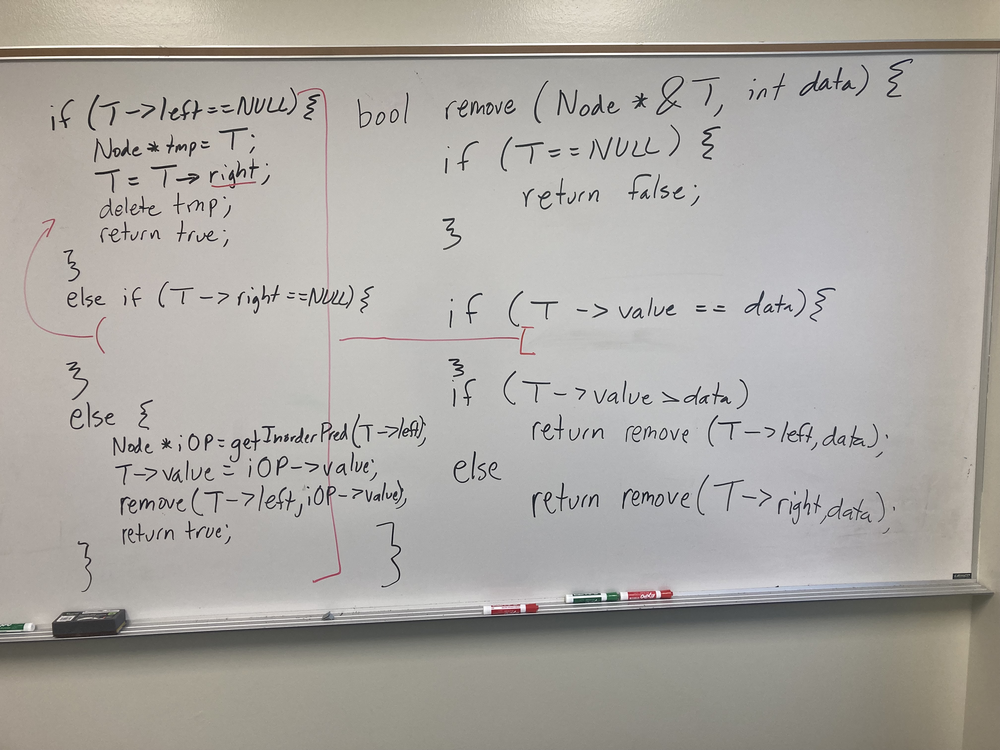